<br>

<a id="imports"></a>

<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; background-color: #ffffff; color: teal;" id="imports">0&nbsp;&nbsp;IMPORTS&nbsp;&nbsp;&nbsp;&nbsp;<a href="#toc">&#10514;</a></h1>

In [1]:
print("\n... IMPORTS STARTING ...\n")

print("\n\tVERSION INFORMATION")
# Machine Learning and Data Science Imports
import tensorflow as tf; print(f"\t\t– TENSORFLOW VERSION: {tf.__version__}");
import pandas as pd; pd.options.mode.chained_assignment = None;
import numpy as np; print(f"\t\t– NUMPY VERSION: {np.__version__}");
import sklearn; print(f"\t\t– SKLEARN VERSION: {sklearn.__version__}");
from sklearn.preprocessing import RobustScaler, PolynomialFeatures
from sklearn.model_selection import GroupKFold, StratifiedKFold
from scipy.spatial import cKDTree



# Built In Imports

from collections import Counter
from datetime import datetime
from glob import glob
import warnings
import requests
import hashlib
import imageio
import IPython
import sklearn
import urllib
import zipfile
import pickle
import random
import shutil
import string
import json
import math
import time
import gzip
import ast
import sys
import io
import os
import gc
import re

# Visualization Imports
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
import matplotlib.patches as patches
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm; tqdm.pandas();
import plotly.express as px
import seaborn as sns
from PIL import Image, ImageEnhance
import matplotlib; print(f"\t\t– MATPLOTLIB VERSION: {matplotlib.__version__}");
from matplotlib import animation, rc; rc('animation', html='jshtml')
import plotly
import PIL
import cv2

import plotly.io as pio
print(pio.renderers)

def seed_it_all(seed=7):
    """ Attempt to be Reproducible """
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)

    
print("\n\n... IMPORTS COMPLETE ...\n")


... IMPORTS STARTING ...


	VERSION INFORMATION
		– TENSORFLOW VERSION: 2.9.2
		– NUMPY VERSION: 1.22.4
		– SKLEARN VERSION: 1.1.1
		– MATPLOTLIB VERSION: 3.5.2
Renderers configuration
-----------------------
    Default renderer: 'plotly_mimetype+notebook'
    Available renderers:
        ['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode',
         'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab',
         'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg',
         'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe',
         'iframe_connected', 'sphinx_gallery', 'sphinx_gallery_png']



... IMPORTS COMPLETE ...



<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: teal; background-color: #ffffff;">2.4 BASIC DATA DEFINITIONS & INITIALIZATIONS</h3>

---


In [4]:
print("\n... BASIC DATA SETUP STARTING ...\n\n")

# Open the training dataframe and display the initial dataframe
TRAIN_DIR = os.path.join(DATA_DIR, "train")
TRAIN_CSV = os.path.join(DATA_DIR, "train.csv")
train_df = pd.read_csv(TRAIN_CSV)

# Get all training images
all_train_images = glob(os.path.join(TRAIN_DIR, "**", "*.png"), recursive=True)

print("\n... ORIGINAL TRAINING DATAFRAME... \n")
display(train_df)

TEST_DIR = os.path.join(DATA_DIR, "test")
SS_CSV   = os.path.join(DATA_DIR, "sample_submission.csv")
ss_df = pd.read_csv(SS_CSV)

# Get all testing images if there are any
all_test_images = glob(os.path.join(TEST_DIR, "**", "*.png"), recursive=True)

print("\n\n\n... ORIGINAL SUBMISSION DATAFRAME... \n")
display(ss_df)

# For debugging purposes when the test set hasn't been substituted we will know
DEBUG=len(ss_df)==0

if DEBUG:
    TEST_DIR = TRAIN_DIR
    all_test_images = all_train_images
    ss_df = train_df.iloc[:10]
    ss_df = ss_df[["id", "class"]]
    ss_df["predicted"] = ""
    
    print("\n\n\n... DEBUG SUBMISSION DATAFRAME... \n")
    display(ss_df)

    

SF2LF = {"lb":"Large Bowel","sb":"Small Bowel","st":"Stomach"}
LF2SF = {v:k for k,v in SF2LF.items()}
print(f"\n\n\n... ARE WE DEBUGGING: {DEBUG}... \n")

print("\n... BASIC DATA SETUP FINISHED ...\n\n")


... BASIC DATA SETUP STARTING ...



... ORIGINAL TRAINING DATAFRAME... 



,id,class,segmentation
0,case123_day20_slice_0001,large_bowel,NaN
1,case123_day20_slice_0001,small_bowel,NaN
2,case123_day20_slice_0001,stomach,NaN
3,case123_day20_slice_0002,large_bowel,NaN
4,case123_day20_slice_0002,small_bowel,NaN
...,...,...,...
115483,case30_day0_slice_0143,small_bowel,NaN
115484,case30_day0_slice_0143,stomach,NaN
115485,case30_day0_slice_0144,large_bowel,NaN
115486,case30_day0_slice_0144,small_bowel,NaN





... ORIGINAL SUBMISSION DATAFRAME... 



,id,class,predicted





... DEBUG SUBMISSION DATAFRAME... 



,id,class,predicted
0,case123_day20_slice_0001,large_bowel,
1,case123_day20_slice_0001,small_bowel,
2,case123_day20_slice_0001,stomach,
3,case123_day20_slice_0002,large_bowel,
4,case123_day20_slice_0002,small_bowel,
5,case123_day20_slice_0002,stomach,
6,case123_day20_slice_0003,large_bowel,
7,case123_day20_slice_0003,small_bowel,
8,case123_day20_slice_0003,stomach,
9,case123_day20_slice_0004,large_bowel,





... ARE WE DEBUGGING: True... 


... BASIC DATA SETUP FINISHED ...




<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: teal; background-color: #ffffff;">2.5 UPDATE DATAFRAMES WITH ACCESSIBLE EXTRA INFORMATION</h3>

---

I wrapped the logic in a preprocessing function but also went through step by step so people could validate if they so wished

**NOTE: I have changed the column identifiers as follows for the sake of brevity:**
* **large_bowel** --> **lb**
* **small_bowel** --> **sb**
* **stomach** --> **st**

In [5]:
def get_filepath_from_partial_identifier(_ident, file_list):
    return [x for x in file_list if _ident in x][0]

def df_preprocessing(df, globbed_file_list, is_test=False):
    """ The preprocessing steps applied to get column information """
    # 1. Get Case-ID as a column (str and int)
    df["case_id_str"] = df["id"].apply(lambda x: x.split("_", 2)[0])
    df["case_id"] = df["id"].apply(lambda x: int(x.split("_", 2)[0].replace("case", "")))

    # 2. Get Day as a column
    df["day_num_str"] = df["id"].apply(lambda x: x.split("_", 2)[1])
    df["day_num"] = df["id"].apply(lambda x: int(x.split("_", 2)[1].replace("day", "")))

    # 3. Get Slice Identifier as a column
    df["slice_id"] = df["id"].apply(lambda x: x.split("_", 2)[2])

    # 4. Get full file paths for the representative scans
    df["_partial_ident"] = (globbed_file_list[0].rsplit("/", 4)[0]+"/"+ # /kaggle/input/uw-madison-gi-tract-image-segmentation/train/
                           df["case_id_str"]+"/"+ # .../case###/
                           df["case_id_str"]+"_"+df["day_num_str"]+ # .../case###_day##/
                           "/scans/"+df["slice_id"]) # .../slice_#### 
    _tmp_merge_df = pd.DataFrame({"_partial_ident":[x.rsplit("_",4)[0] for x in globbed_file_list], "f_path":globbed_file_list})
    df = df.merge(_tmp_merge_df, on="_partial_ident").drop(columns=["_partial_ident"])

    # 5. Get slice dimensions from filepath (int in pixels)
    df["slice_h"] = df["f_path"].apply(lambda x: int(x[:-4].rsplit("_",4)[1]))
    df["slice_w"] = df["f_path"].apply(lambda x: int(x[:-4].rsplit("_",4)[2]))

    # 6. Pixel spacing from filepath (float in mm)
    df["px_spacing_h"] = df["f_path"].apply(lambda x: float(x[:-4].rsplit("_",4)[3]))
    df["px_spacing_w"] = df["f_path"].apply(lambda x: float(x[:-4].rsplit("_",4)[4]))

    if not is_test:
        # 7. Merge 3 Rows Into A Single Row (As This/Segmentation-RLE Is The Only Unique Information Across Those Rows)
        l_bowel_df = df[df["class"]=="large_bowel"][["id", "segmentation"]].rename(columns={"segmentation":"lb_seg_rle"})
        s_bowel_df = df[df["class"]=="small_bowel"][["id", "segmentation"]].rename(columns={"segmentation":"sb_seg_rle"})
        stomach_df = df[df["class"]=="stomach"][["id", "segmentation"]].rename(columns={"segmentation":"st_seg_rle"})
        df = df.merge(l_bowel_df, on="id", how="left")
        df = df.merge(s_bowel_df, on="id", how="left")
        df = df.merge(stomach_df, on="id", how="left")
        df = df.drop_duplicates(subset=["id",]).reset_index(drop=True)
        df["lb_seg_flag"] = df["lb_seg_rle"].apply(lambda x: not pd.isna(x))
        df["sb_seg_flag"] = df["sb_seg_rle"].apply(lambda x: not pd.isna(x))
        df["st_seg_flag"] = df["st_seg_rle"].apply(lambda x: not pd.isna(x))
        df["n_segs"] = df["lb_seg_flag"].astype(int)+df["sb_seg_flag"].astype(int)+df["st_seg_flag"].astype(int)

    # 8. Reorder columns to the a new ordering (drops class and segmentation as no longer necessary)
    new_col_order = ["id", "f_path", "n_segs",
                     "lb_seg_rle", "lb_seg_flag",
                     "sb_seg_rle", "sb_seg_flag", 
                     "st_seg_rle", "st_seg_flag",
                     "slice_h", "slice_w", "px_spacing_h", 
                     "px_spacing_w", "case_id_str", "case_id", 
                     "day_num_str", "day_num", "slice_id",]
    if is_test: new_col_order.insert(1, "class")
    new_col_order = [_c for _c in new_col_order if _c in df.columns]
    df = df[new_col_order]
    
    return df

In [6]:
print("\n... UPDATING DATAFRAMES WITH ACCESSIBLE INFORMATION STARTED ...\n\n")

# 1. Get Case-ID as a column (str and int)
train_df["case_id_str"] = train_df["id"].apply(lambda x: x.split("_", 2)[0])
train_df["case_id"] = train_df["id"].apply(lambda x: int(x.split("_", 2)[0].replace("case", "")))

# 2. Get Day as a column
train_df["day_num_str"] = train_df["id"].apply(lambda x: x.split("_", 2)[1])
train_df["day_num"] = train_df["id"].apply(lambda x: int(x.split("_", 2)[1].replace("day", "")))

# 3. Get Slice Identifier as a column
train_df["slice_id"] = train_df["id"].apply(lambda x: x.split("_", 2)[2])

# 4. Get full file paths for the representative scans
train_df["_partial_ident"] = (TRAIN_DIR+"/"+ # /kaggle/input/uw-madison-gi-tract-image-segmentation/train/
                             train_df["case_id_str"]+"/"+ # .../case###/
                             train_df["case_id_str"]+"_"+train_df["day_num_str"]+ # .../case###_day##/
                             "/scans/"+train_df["slice_id"]) # .../slice_#### 
_tmp_merge_df = pd.DataFrame({"_partial_ident":[x.rsplit("_",4)[0] for x in all_train_images], "f_path":all_train_images})
train_df = train_df.merge(_tmp_merge_df, on="_partial_ident").drop(columns=["_partial_ident"])

# Minor cleanup of our temporary workaround
del _tmp_merge_df; gc.collect(); gc.collect()

# 5. Get slice dimensions from filepath (int in pixels)
train_df["slice_h"] = train_df["f_path"].apply(lambda x: int(x[:-4].rsplit("_",4)[1]))
train_df["slice_w"] = train_df["f_path"].apply(lambda x: int(x[:-4].rsplit("_",4)[2]))

# 6. Pixel spacing from filepath (float in mm)
train_df["px_spacing_h"] = train_df["f_path"].apply(lambda x: float(x[:-4].rsplit("_",4)[3]))
train_df["px_spacing_w"] = train_df["f_path"].apply(lambda x: float(x[:-4].rsplit("_",4)[4]))

# 7. Merge 3 Rows Into A Single Row (As This/Segmentation-RLE Is The Only Unique Information Across Those Rows)
l_bowel_train_df = train_df[train_df["class"]=="large_bowel"][["id", "segmentation"]].rename(columns={"segmentation":"lb_seg_rle"})
s_bowel_train_df = train_df[train_df["class"]=="small_bowel"][["id", "segmentation"]].rename(columns={"segmentation":"sb_seg_rle"})
stomach_train_df = train_df[train_df["class"]=="stomach"][["id", "segmentation"]].rename(columns={"segmentation":"st_seg_rle"})
train_df = train_df.merge(l_bowel_train_df, on="id", how="left")
train_df = train_df.merge(s_bowel_train_df, on="id", how="left")
train_df = train_df.merge(stomach_train_df, on="id", how="left")
train_df = train_df.drop_duplicates(subset=["id",]).reset_index(drop=True)
train_df["lb_seg_flag"] = train_df["lb_seg_rle"].apply(lambda x: not pd.isna(x))
train_df["sb_seg_flag"] = train_df["sb_seg_rle"].apply(lambda x: not pd.isna(x))
train_df["st_seg_flag"] = train_df["st_seg_rle"].apply(lambda x: not pd.isna(x))
train_df["n_segs"] = train_df["lb_seg_flag"].astype(int)+train_df["sb_seg_flag"].astype(int)+train_df["st_seg_flag"].astype(int)

# 8. Reorder columns to the a new ordering (drops class and segmentation as no longer necessary)
train_df = train_df[["id", "f_path", "n_segs",
                     "lb_seg_rle", "lb_seg_flag",
                     "sb_seg_rle", "sb_seg_flag", 
                     "st_seg_rle", "st_seg_flag",
                     "slice_h", "slice_w", "px_spacing_h", 
                     "px_spacing_w", "case_id_str", "case_id", 
                     "day_num_str", "day_num", "slice_id",]]

# 9. Display update dataframe
print("\n... UPDATED TRAINING DATAFRAME... \n")
display(train_df)

ss_df = df_preprocessing(ss_df, all_test_images, is_test=True)
print("\n\n\n... UPDATED SUBMISSION DATAFRAME... \n")
display(ss_df)

print("\n... UPDATING DATAFRAMES WITH ACCESSIBLE INFORMATION FINISHED ...\n\n")


... UPDATING DATAFRAMES WITH ACCESSIBLE INFORMATION STARTED ...



... UPDATED TRAINING DATAFRAME... 



,id,f_path,n_segs,lb_seg_rle,lb_seg_flag,sb_seg_rle,sb_seg_flag,st_seg_rle,st_seg_flag,slice_h,slice_w,px_spacing_h,px_spacing_w,case_id_str,case_id,day_num_str,day_num,slice_id
0,case123_day20_slice_0001,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case123,123,day20,20,slice_0001
1,case123_day20_slice_0002,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case123,123,day20,20,slice_0002
2,case123_day20_slice_0003,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case123,123,day20,20,slice_0003
3,case123_day20_slice_0004,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case123,123,day20,20,slice_0004
4,case123_day20_slice_0005,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case123,123,day20,20,slice_0005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38491,case30_day0_slice_0140,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case30,30,day0,0,slice_0140
38492,case30_day0_slice_0141,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case30,30,day0,0,slice_0141
38493,case30_day0_slice_0142,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case30,30,day0,0,slice_0142
38494,case30_day0_slice_0143,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,266,1.5,1.5,case30,30,day0,0,slice_0143





... UPDATED SUBMISSION DATAFRAME... 



,id,class,f_path,slice_h,slice_w,px_spacing_h,px_spacing_w,case_id_str,case_id,day_num_str,day_num,slice_id
0,case123_day20_slice_0001,large_bowel,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,266,266,1.5,1.5,case123,123,day20,20,slice_0001
1,case123_day20_slice_0001,small_bowel,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,266,266,1.5,1.5,case123,123,day20,20,slice_0001
2,case123_day20_slice_0001,stomach,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,266,266,1.5,1.5,case123,123,day20,20,slice_0001
3,case123_day20_slice_0002,large_bowel,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,266,266,1.5,1.5,case123,123,day20,20,slice_0002
4,case123_day20_slice_0002,small_bowel,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,266,266,1.5,1.5,case123,123,day20,20,slice_0002
5,case123_day20_slice_0002,stomach,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,266,266,1.5,1.5,case123,123,day20,20,slice_0002
6,case123_day20_slice_0003,large_bowel,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,266,266,1.5,1.5,case123,123,day20,20,slice_0003
7,case123_day20_slice_0003,small_bowel,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,266,266,1.5,1.5,case123,123,day20,20,slice_0003
8,case123_day20_slice_0003,stomach,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,266,266,1.5,1.5,case123,123,day20,20,slice_0003
9,case123_day20_slice_0004,large_bowel,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,266,266,1.5,1.5,case123,123,day20,20,slice_0004



... UPDATING DATAFRAMES WITH ACCESSIBLE INFORMATION FINISHED ...




<br>


<a id="helper_functions"></a>


<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; color: teal; background-color: #ffffff;" id="helper_functions">
    3&nbsp;&nbsp;HELPER FUNCTION & CLASSES&nbsp;&nbsp;&nbsp;&nbsp;<a href="#toc">&#10514;</a>
</h1>

---

In [7]:
# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
# modified from: https://www.kaggle.com/inversion/run-length-decoding-quick-start
def rle_decode(mask_rle, shape, color=1):
    """ TBD
    
    Args:
        mask_rle (str): run-length as string formated (start length)
        shape (tuple of ints): (height,width) of array to return 
    
    Returns: 
        Mask (np.array)
            - 1 indicating mask
            - 0 indicating background

    """
    # Split the string by space, then convert it into a integer array
    s = np.array(mask_rle.split(), dtype=int)

    # Every even value is the start, every odd value is the "run" length
    starts = s[0::2] - 1
    lengths = s[1::2]
    ends = starts + lengths

    # The image image is actually flattened since RLE is a 1D "run"
    if len(shape)==3:
        h, w, d = shape
        img = np.zeros((h * w, d), dtype=np.float32)
    else:
        h, w = shape
        img = np.zeros((h * w,), dtype=np.float32)

    # The color here is actually just any integer you want!
    for lo, hi in zip(starts, ends):
        img[lo : hi] = color
        
    # Don't forget to change the image back to the original shape
    return img.reshape(shape)

# https://www.kaggle.com/namgalielei/which-reshape-is-used-in-rle
def rle_decode_top_to_bot_first(mask_rle, shape):
    """ TBD
    
    Args:
        mask_rle (str): run-length as string formated (start length)
        shape (tuple of ints): (height,width) of array to return 
    
    Returns:
        Mask (np.array)
            - 1 indicating mask
            - 0 indicating background

    """
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape((shape[1], shape[0]), order='F').T  # Reshape from top -> bottom first

# ref.: https://www.kaggle.com/stainsby/fast-tested-rle
def rle_encode(img):
    """ TBD
    
    Args:
        img (np.array): 
            - 1 indicating mask
            - 0 indicating background
    
    Returns: 
        run length as string formated
    """
    
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def flatten_l_o_l(nested_list):
    """ Flatten a list of lists """
    return [item for sublist in nested_list for item in sublist]

def load_json_to_dict(json_path):
    """ tbd """
    with open(json_path) as json_file:
        data = json.load(json_file)
    return data

def tf_load_png(img_path):
    return tf.image.decode_png(tf.io.read_file(img_path), channels=3)

def open_gray16(_path, normalize=True, to_rgb=False):
    """ Helper to open files """
    if normalize:
        if to_rgb:
            return np.tile(np.expand_dims(cv2.imread(_path, cv2.IMREAD_ANYDEPTH)/65535., axis=-1), 3)
        else:
            return cv2.imread(_path, cv2.IMREAD_ANYDEPTH)/65535.
    else:
        if to_rgb:
            return np.tile(np.expand_dims(cv2.imread(_path, cv2.IMREAD_ANYDEPTH), axis=-1), 3)
        else:
            return cv2.imread(_path, cv2.IMREAD_ANYDEPTH)

<br>


<a id="create_dataset"></a>


<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; color: teal; background-color: #ffffff;" id="create_dataset">
    4&nbsp;&nbsp;DATASET EXPLORATION&nbsp;&nbsp;&nbsp;&nbsp;<a href="#toc">&#10514;</a>
</h1>

---

<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: teal; background-color: #ffffff;">4.0 LOOK AT A SINGLE EXAMPLE PRIOR TO INVESTIGATION</h3>

---

Do this to make sure everything is where it should be and understand the basics of how to access all the relevant data.

Wrap this basic exploration functionality as single function to allow for easy examination of any passed identifier

In [8]:
def get_overlay(img_path, rle_strs, img_shape, _alpha=0.999, _beta=0.35, _gamma=0):
    _img = open_gray16(img_path, to_rgb=True)
    _img = ((_img-_img.min())/(_img.max()-_img.min())).astype(np.float32)
    _seg_rgb = np.stack([rle_decode(rle_str, shape=img_shape, color=1) if rle_str is not None else np.zeros(img_shape, dtype=np.float32) for rle_str in rle_strs], axis=-1).astype(np.float32)
    seg_overlay = cv2.addWeighted(src1=_img, alpha=_alpha, 
                                  src2=_seg_rgb, beta=_beta, gamma=_gamma)
    return seg_overlay

def examine_id(ex_id, df=train_df, plot_overlay=True, print_meta=False, plot_grayscale=False, plot_binary_segmentation=False):
    """ Wrapper function to allow for easy visual exploration of an example """
    print(f"\n... ID ({ex_id}) EXPLORATION STARTED ...\n\n")
    demo_ex = df[df.id==ex_id].squeeze()

    if print_meta:
        print(f"\n... WITH DEMO_ID=`{DEMO_ID}` WE HAVE THE FOLLOWING DEMO EXAMPLE TO WORK FROM... \n\n")
        display(demo_ex.to_frame())

    if plot_grayscale:
        print(f"\n\n... GRAYSCALE IMAGE PLOT ...\n")
        plt.figure(figsize=(12,12))
        plt.imshow(open_gray16(demo_ex.f_path), cmap="gray")
        plt.title(f"Original Grayscale Image For ID: {demo_ex.id}", fontweight="bold")
        plt.axis(False)
        plt.show()

    if plot_binary_segmentation:
        print(f"\n\n... BINARY SEGMENTATION MASKS ...\n")
        plt.figure(figsize=(20,10))
        for i, _seg_type in enumerate(["lb", "sb", "st"]):
            if pd.isna(demo_ex[f"{_seg_type}_seg_rle"]): continue
            plt.subplot(1,3,i+1)
            plt.imshow(rle_decode(demo_ex[f"{_seg_type}_seg_rle"], shape=(demo_ex.slice_w, demo_ex.slice_h), color=1))
            plt.title(f"RLE Encoding For {SF2LF[_seg_type]} Segmentation", fontweight="bold")
            plt.axis(False)
        plt.tight_layout()
        plt.show()

    if plot_overlay:
        print(f"\n\n... IMAGE WITH RGB SEGMENTATION MASK OVERLAY ...\n")
        # We need to normalize the loaded image values to be between 0 and 1 or else our plot will look weird
        # _img = open_gray16(demo_ex.f_path, to_rgb=True)
        #_img = ((_img-_img.min())/(_img.max()-_img.min())).astype(np.float32)
        #_seg_rgb = np.stack([rle_decode(demo_ex[f"{_seg_type}_seg_rle"], shape=(demo_ex.slice_w, demo_ex.slice_h), color=1) if not pd.isna(demo_ex[f"{_seg_type}_seg_rle"]) else np.zeros((demo_ex.slice_w, demo_ex.slice_h)) for _seg_type in ["lb", "sb", "st"]], axis=-1).astype(np.float32)
        #seg_overlay = cv2.addWeighted(src1=_img, alpha=0.99, 
                                      #src2=_seg_rgb, beta=0.33, gamma=0)
        _rle_strs = [demo_ex[f"{_seg_type}_seg_rle"] if not pd.isna(demo_ex[f"{_seg_type}_seg_rle"]) else None for _seg_type in ["lb", "sb", "st"]]
        seg_overlay = get_overlay(demo_ex.f_path, _rle_strs, img_shape=(demo_ex.slice_w, demo_ex.slice_h))

        plt.figure(figsize=(12,12))
        plt.imshow(seg_overlay)
        plt.title(f"Segmentation Overlay For ID: {demo_ex.id}", fontweight="bold")
        handles = [Rectangle((0,0),1,1, color=_c) for _c in [(0.667,0.0,0.0), (0.0,0.667,0.0), (0.0,0.0,0.667)]]
        labels = ["Large Bowel Segmentation Map", "Small Bowel Segmentation Map", "Stomach Segmentation Map"]
        plt.legend(handles,labels)
        plt.axis(False)
        plt.show()

    print("\n\n... SINGLE ID EXPLORATION FINISHED ...\n\n")


... SINGLE ID EXPLORATION STARTED ...



... WITH DEMO_ID=`case123_day20_slice_0082` WE HAVE THE FOLLOWING DEMO EXAMPLE TO WORK FROM... 




,81
id,case123_day20_slice_0082
f_path,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...
n_segs,3
lb_seg_rle,17481 4 17746 7 18010 10 18275 12 18539 14 188...
lb_seg_flag,True
sb_seg_rle,22236 2 22500 6 22765 8 23030 10 23296 10 2356...
sb_seg_flag,True
st_seg_rle,11052 8 11314 15 11578 19 11843 23 12108 26 12...
st_seg_flag,True
slice_h,266




... LET'S PLOT THE IMAGE FIRST ...



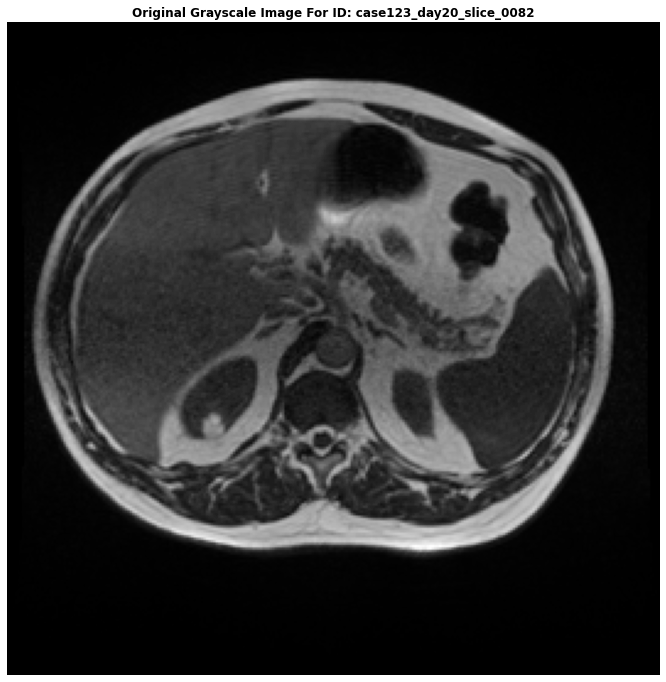



... LET'S PLOT THE 3 SEGMENTATION MASKS ...



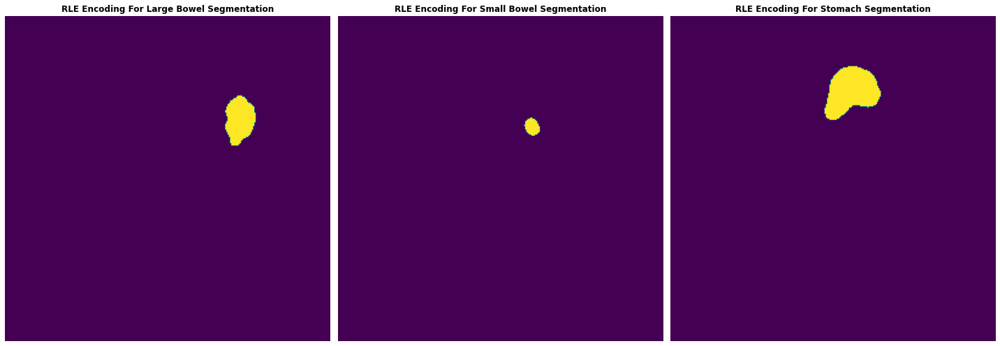

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).




... LET'S PLOT THE IMAGE WITH AN RGB SEGMENTATION MASK OVERLAY ...



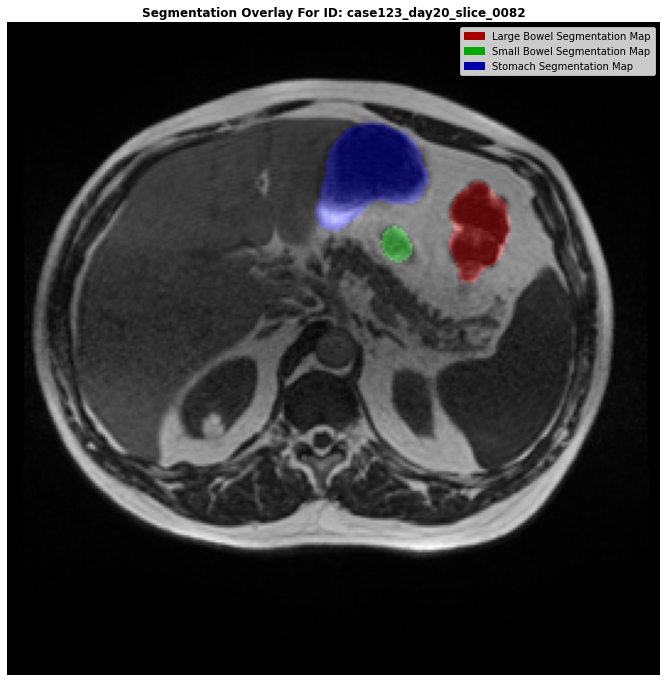



... LET'S PRINT THE RELEVANT INFORMATION ...

	--> IMAGE CASE ID              : 123
	--> IMAGE DAY NUMBER           : 20
	--> IMAGE SLICE WIDTH          : 266
	--> IMAGE SLICE HEIGHT         : 266
	--> IMAGE PIXEL SPACING WIDTH  : 1.5
	--> IMAGE PIXEL SPACING HEIGHT : 1.5


... SINGLE ID EXPLORATION FINISHED ...




In [9]:
print("\n... SINGLE ID EXPLORATION STARTED ...\n\n")

DEMO_ID = "case123_day20_slice_0082"
demo_ex = train_df[train_df.id==DEMO_ID].squeeze()

print(f"\n... WITH DEMO_ID=`{DEMO_ID}` WE HAVE THE FOLLOWING DEMO EXAMPLE TO WORK FROM... \n\n")
display(demo_ex.to_frame())

print(f"\n\n... LET'S PLOT THE IMAGE FIRST ...\n")
plt.figure(figsize=(12,12))
plt.imshow(open_gray16(demo_ex.f_path), cmap="gray")
plt.title(f"Original Grayscale Image For ID: {demo_ex.id}", fontweight="bold")
plt.axis(False)
plt.show()

print(f"\n\n... LET'S PLOT THE 3 SEGMENTATION MASKS ...\n")

plt.figure(figsize=(20,10))
for i, _seg_type in enumerate(["lb", "sb", "st"]):
    if pd.isna(demo_ex[f"{_seg_type}_seg_rle"]): continue
    plt.subplot(1,3,i+1)
    plt.imshow(rle_decode(demo_ex[f"{_seg_type}_seg_rle"], shape=(demo_ex.slice_w, demo_ex.slice_h), color=1))
    plt.title(f"RLE Encoding For {SF2LF[_seg_type]} Segmentation", fontweight="bold")
    plt.axis(False)
plt.tight_layout()
plt.show()

print(f"\n\n... LET'S PLOT THE IMAGE WITH AN RGB SEGMENTATION MASK OVERLAY ...\n")

# We need to normalize the loaded image values to be between 0 and 1 or else our plot will look weird
_img = open_gray16(demo_ex.f_path, to_rgb=True)
_img = ((_img-_img.min())/(_img.max()-_img.min())).astype(np.float32)
_seg_rgb = np.stack([rle_decode(demo_ex[f"{_seg_type}_seg_rle"], shape=(demo_ex.slice_w, demo_ex.slice_h), color=1) if not pd.isna(demo_ex[f"{_seg_type}_seg_rle"]) else np.zeros((demo_ex.slice_w, demo_ex.slice_h)) for _seg_type in ["lb", "sb", "st"]], axis=-1).astype(np.float32)
seg_overlay = cv2.addWeighted(src1=_img, alpha=0.99, 
                              src2=_seg_rgb, beta=0.33, gamma=0.0)

plt.figure(figsize=(12,12))
plt.imshow(seg_overlay)
plt.title(f"Segmentation Overlay For ID: {demo_ex.id}", fontweight="bold")
handles = [Rectangle((0,0),1,1, color=_c) for _c in [(0.667,0.0,0.0), (0.0,0.667,0.0), (0.0,0.0,0.667)]]
labels = ["Large Bowel Segmentation Map", "Small Bowel Segmentation Map", "Stomach Segmentation Map"]
plt.legend(handles,labels)
plt.axis(False)
plt.show()

print(f"\n\n... LET'S PRINT THE RELEVANT INFORMATION ...\n")
print(f"\t--> IMAGE CASE ID              : {demo_ex.case_id}")
print(f"\t--> IMAGE DAY NUMBER           : {demo_ex.day_num}")
print(f"\t--> IMAGE SLICE WIDTH          : {demo_ex.slice_w}")
print(f"\t--> IMAGE SLICE HEIGHT         : {demo_ex.slice_h}")
print(f"\t--> IMAGE PIXEL SPACING WIDTH  : {demo_ex.px_spacing_w}")
print(f"\t--> IMAGE PIXEL SPACING HEIGHT : {demo_ex.px_spacing_h}")

print("\n\n... SINGLE ID EXPLORATION FINISHED ...\n\n")


... ID (case131_day15_slice_0029) EXPLORATION STARTED ...




... IMAGE WITH RGB SEGMENTATION MASK OVERLAY ...



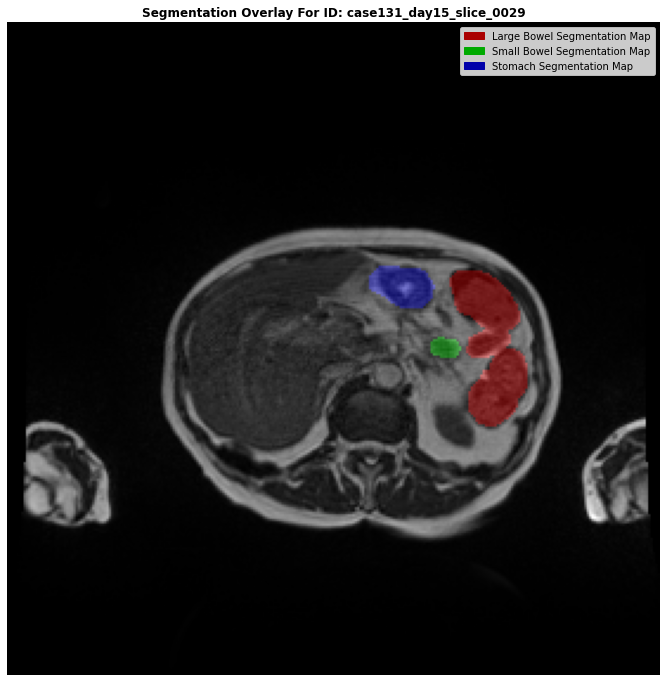



... SINGLE ID EXPLORATION FINISHED ...



... ID (case116_day0_slice_0071) EXPLORATION STARTED ...




... IMAGE WITH RGB SEGMENTATION MASK OVERLAY ...



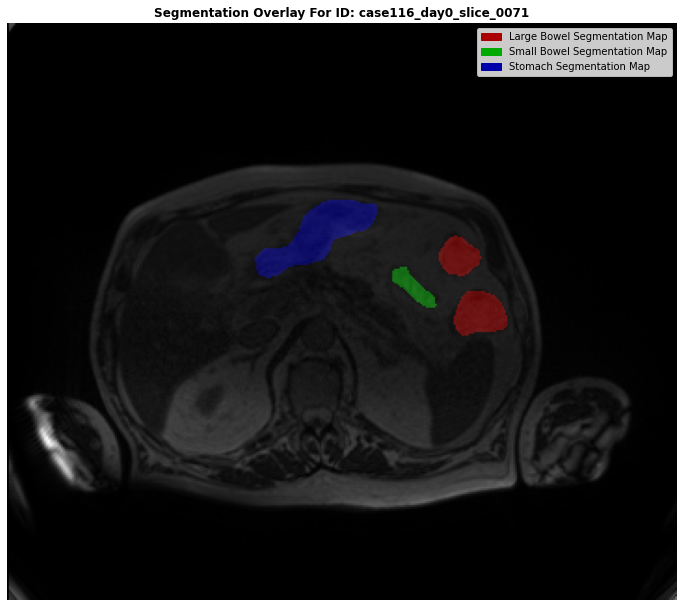



... SINGLE ID EXPLORATION FINISHED ...




In [10]:
# Plot 2 random-ids where all tumor locales are present (max one id per case)
N_TO_PLOT = 2
for _id in train_df[train_df.n_segs==3].groupby("case_id")["id"].first().sample(N_TO_PLOT):
    examine_id(_id)

<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: teal; background-color: #ffffff;">4.1 INVESTIGATE THE OCCURENCE SEGMENTATION MAP TYPES</h3>

---

It's quite apparent that not all images have segmentation maps for the various regions (stomach, large-bowel, small-bowel), so we will identify the frequency for which these occur independently... as well as the frequency for which these maps co-occur.

<br><b style="text-decoration: underline; font-family: Verdana; text-transform: uppercase;">OBSERVATIONS</b>

* There are **38,496** total examples.
* It can be observed that more than half of the given examples have no annotations present!
    * There are **21,906** (56.9046%) examples with no annotations/masks/segmentation present
    * Inversely there are **16,590** (43.0954%) examples with one or more annotations present
* There are **2,468** (6.41%) examples with **one annotation present**. 
* It can be observed that the vast majority of single mask annotations are **Stomach**!
    * Of these annotations, **2286** (~92.6%) are **Stomach**
    * Of these annotations, **123** (~4.98%) are **Large Bowel**
    * Of these annotations, **59** (~2.39%) are **Small Bowel**
* There are **10,921** (28.37%) examples with **two annotations present**. 
* It can be observed, in contrast to the single annotation examples, that the majority of annotations do NOT include stomach i.e. **'Large Bowel, Small Bowel'**!
    * Of these annotations, **7781** (~71.3%) are **'Large Bowel, Small Bowel'**
    * Of these annotations, **2980** (~27.3%) are **'Large Bowel, Stomach'**
    * Of these annotations, **160** (~1.47%) are **'Small Bowel, Stomach'**
* Finally, there are **3,201** (8.32%) examples with **all three annotations present**. 

<!--  # print(len(train_df))
# print(len(train_df[train_df["seg_combo_str"]=="No Mask"]), len(train_df[train_df["seg_combo_str"]=="No Mask"])/len(train_df))
# print(len(train_df[train_df["seg_combo_str"]=="Large Bowel"])/2468)
# print(len(train_df[train_df["seg_combo_str"]=="Small Bowel"])/2468)
# print(len(train_df[train_df["seg_combo_str"]=="Stomach"])/2468)
# print(len(train_df[train_df["seg_combo_str"].apply(lambda x: x.count(",")==1)]))
# print(len(train_df[train_df["seg_combo_str"]=="Large Bowel, Stomach"])/10921)
# print(len(train_df[train_df["seg_combo_str"]=="Large Bowel, Small Bowel"])/10921)
# print(len(train_df[train_df["seg_combo_str"]=="Small Bowel, Stomach"])/10921)
# print(len(train_df[train_df["seg_combo_str"].apply(lambda x: x.count(",")==2)])) -->

In [11]:
def get_seg_combo_str(row):
    seg_str_list = []
    if row["lb_seg_flag"]: seg_str_list.append("Large Bowel")
    if row["sb_seg_flag"]: seg_str_list.append("Small Bowel")
    if row["st_seg_flag"]: seg_str_list.append("Stomach")
    if len(seg_str_list)>0:
        return ", ".join(seg_str_list)
    else:
        return "No Mask"
train_df["seg_combo_str"] = train_df.progress_apply(get_seg_combo_str, axis=1)

fig = px.histogram(train_df, train_df["n_segs"].astype(str), color="seg_combo_str", title="<b>Number of Segmentation Masks Per Image</b>", 
                  labels={"x":"Number of Segmentation Masks Per Image", "seg_combo_str":"<b>Segmentation Masks Present</b>"})
fig.show()

  0%|          | 0/38496 [00:00<?, ?it/s]

<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: teal; background-color: #ffffff;">4.2 INVESTIGATE THE IMAGE SIZES</h3>

---

It's observable that not all images have the same size... however, given that, there is not that much variation between image slice sizes.

<br><b style="text-decoration: underline; font-family: Verdana; text-transform: uppercase;">OBSERVATIONS</b>
* Remember, there are **38,496** total examples.
* Globally, I can see that 3 of the image shapes are **square** while one is **rectangular** and they all fall within a fairly tight distribution of relatively small sizes
* Of these there are **4** unique sizes:
    * $234 \times 234$
        * **Least frequent** image size
        * **Smallest** image size
        * Only **144** of the 38,496 occurences are this size (0.37%)
    * $266 \times 266$
        * **Most frequent** image size
        * **Second smallest** image size
        * **25,920** of the 38,496 occurences are this size (67.33%)
    * $276 \times 276$
        * **Second least frequent** image size
        * **Second largest** image size
        * **1,200** of the 38,496 occurences are this size (3.12%)
    * $310 \times 360$
        * **Second most frequent** image size
        * **Largest** image size
        * **11,232** of the 38,496 occurences are this size (29.17%)





In [12]:
fig = px.scatter(train_df.drop_duplicates(subset=["slice_w", "slice_h"]), x="slice_w", y="slice_h", 
                 size=train_df.groupby(["slice_w", "slice_h"])["id"].transform("count").iloc[train_df.drop_duplicates(subset=["slice_w", "slice_h"]).index], 
                 color="("+train_df.drop_duplicates(subset=["slice_w", "slice_h"])["slice_w"].astype(str)+","+train_df.drop_duplicates(subset=["slice_w", "slice_h"])["slice_h"].astype(str)+")", 
                 title="<b>Bubble Chart Showing The Various Image Sizes</b>",
                 labels={"color":"<b>Size Legend</b>", 
                         "size":"<b>Number Of Observations</b>",
                         "slice_h":"<b>Image Slice Height (pixels)</b>",
                         "slice_w":"<b>Image Slice Width (pixels)</b>"},
                 size_max=160)
fig.show()

<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: teal; background-color: #ffffff;">4.3 INVESTIGATE THE PIXEL SPACING</h3>

---

It's observable that not all images have the same pixel spacing... however, given that, there is not that much variation between pixel spacing.

<br><b style="text-decoration: underline; font-family: Verdana; text-transform: uppercase;">OBSERVATIONS</b>
* Remember, there are **38,496** total examples.
* Globally, we can see that all of the pixel spacings are **square** and that the vast majority are $1.50mm \times 1.50mm$
* There are only **2** unique sets of pixel spacings:
    * $1.50mm \times 1.50mm$
        * **Most frequent** pixel spacing
        * **Smallest** pixel spacing (barely)
        * **37,296** of the 38,496 occurences are this size (96.88%)
    * $1.63mm \times 1.63mm$
        * **Least frequent** image size
        * **Largest** pixel spacing (barely)
        * **1,200** of the 38,496 occurences are this size (3.12%)

In [13]:
fig = px.scatter(train_df.drop_duplicates(subset=["px_spacing_w", "px_spacing_h"]), x="px_spacing_w", y="px_spacing_h", 
                 size=train_df.groupby(["px_spacing_w", "px_spacing_h"])["id"].transform("count").iloc[train_df.drop_duplicates(subset=["px_spacing_w", "px_spacing_h"]).index], 
                 color="("+train_df.drop_duplicates(subset=["px_spacing_w", "px_spacing_h"])["px_spacing_w"].astype(str)+","+train_df.drop_duplicates(subset=["px_spacing_w", "px_spacing_h"])["px_spacing_h"].astype(str)+")", 
                 title="<b>Bubble Chart Showing The Various Pixel Spacings</b>",
                 labels={"color":"<b>Pixel Spacing Sets Legend</b>", 
                         "size":"<b>Number Of Observations</b>",
                         "px_spacing_h":"<b>Pixel Spacing Height (mm)</b>",
                         "px_spacing_w":"<b>Pixel Spacing Width (mm)</b>"},
                 size_max=160)
fig.show()

<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: teal; background-color: #ffffff;">4.4 INVESTIGATE CASE IDS</h3>

---

Here's the host description of **`case_id`**

> "Each case in this competition is represented by multiple sets of scan slices (each set is identified by the day the scan took place). Some cases are split by time (early days are in train, later days are in test) while some cases are split by case - the entirety of the case is in train or test. The goal of this competition is to be able to generalize to both partially and wholly unseen cases."

I don't really observe any oddities associated with any particular **`case_id`** values. I would probably attempt to group them when stratifying/creating-folds... however, they don't seem to perpetrate an obvious bias.

When I colour by **day**, I can see that all cases are made up (mostly) of groups of **144**, or less frequently, **80**, images from different days.

In [14]:
fig = px.histogram(train_df, train_df.case_id.astype(str), color="day_num_str", title="<b>Distribution Of Images Per Case ID</b>", 
             labels={"x":"<b>Case ID</b>", "day_num_str": "<b>The Day The Scan Took Place</b>"}, text_auto=True, width=2000)
fig.show()



... PLOTTING DEMO CASE ID #134 ...


...Preparing...
...Plotting...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


...Displaying...


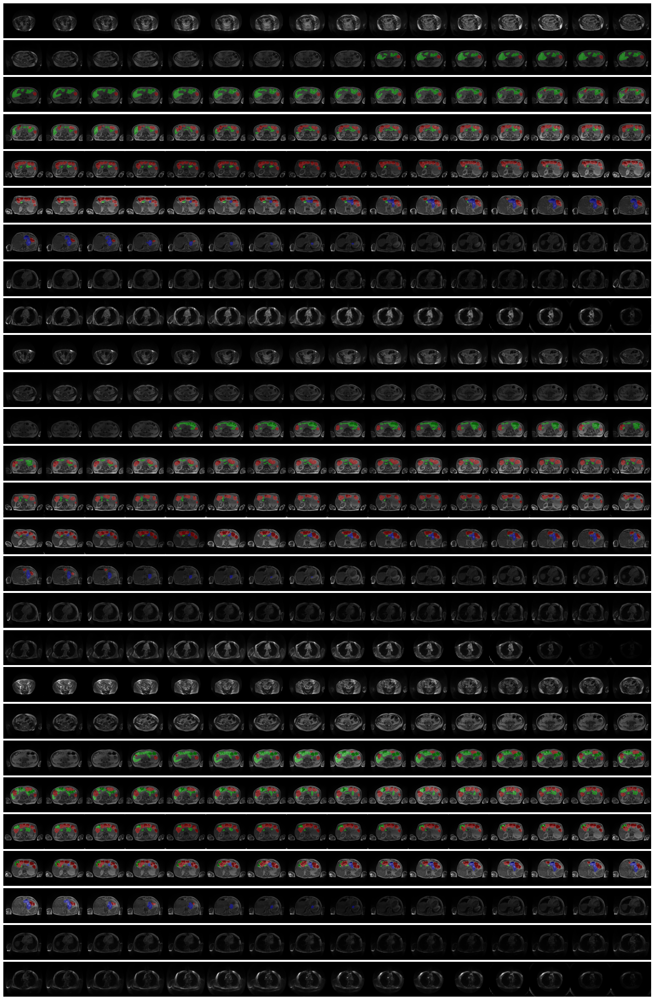





... PLOTTING DEMO CASE ID #9 ...


...Preparing...
...Plotting...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


...Displaying...


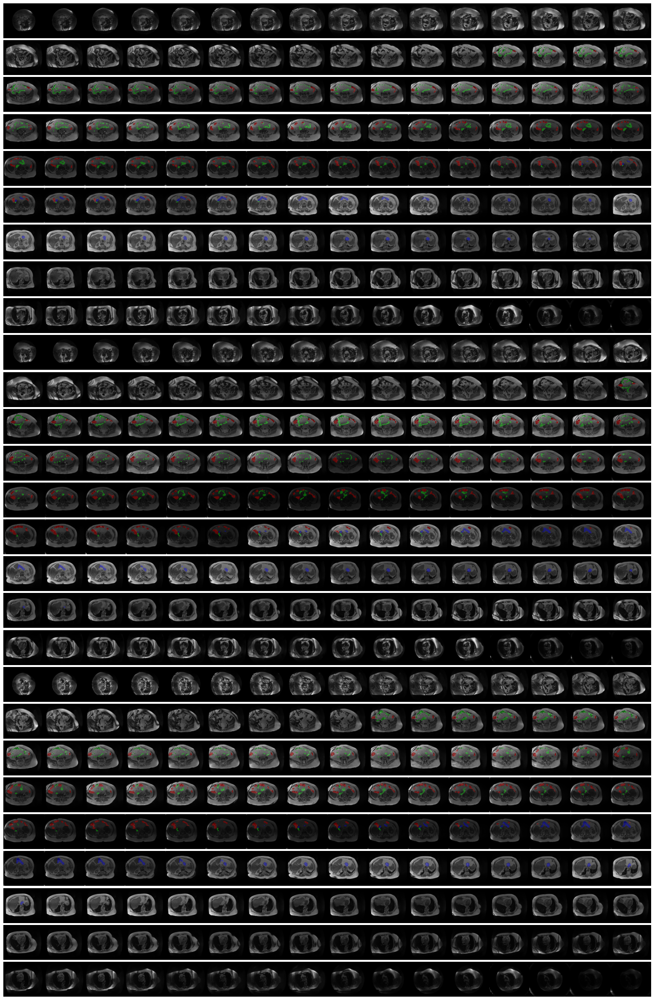




... PLOTTING DEMO CASE ID #7 - FOR DAY #0 ...


...Preparing...
...Plotting...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

...Displaying...


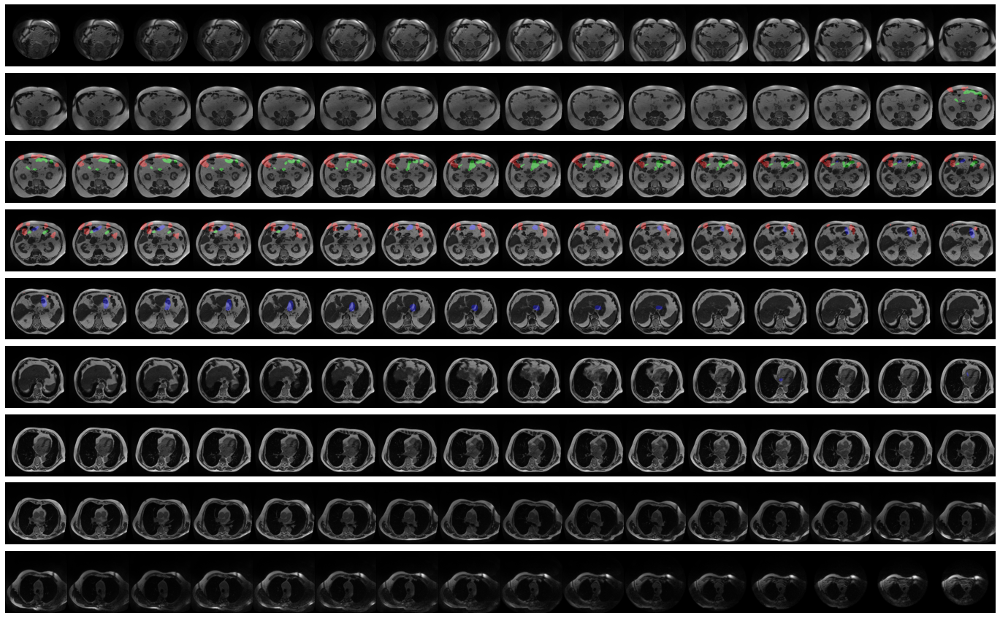




... PLOTTING DEMO CASE ID #7 - FOR DAY #13 ...


...Preparing...
...Plotting...
...Displaying...


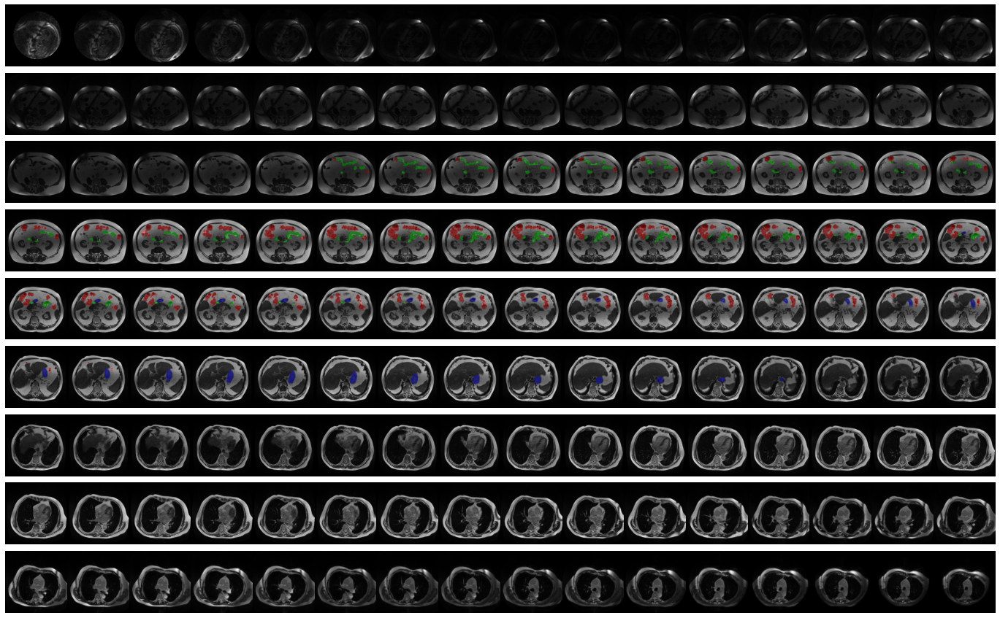




... PLOTTING DEMO CASE ID #7 - FOR DAY #19 ...


...Preparing...
...Plotting...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


...Displaying...


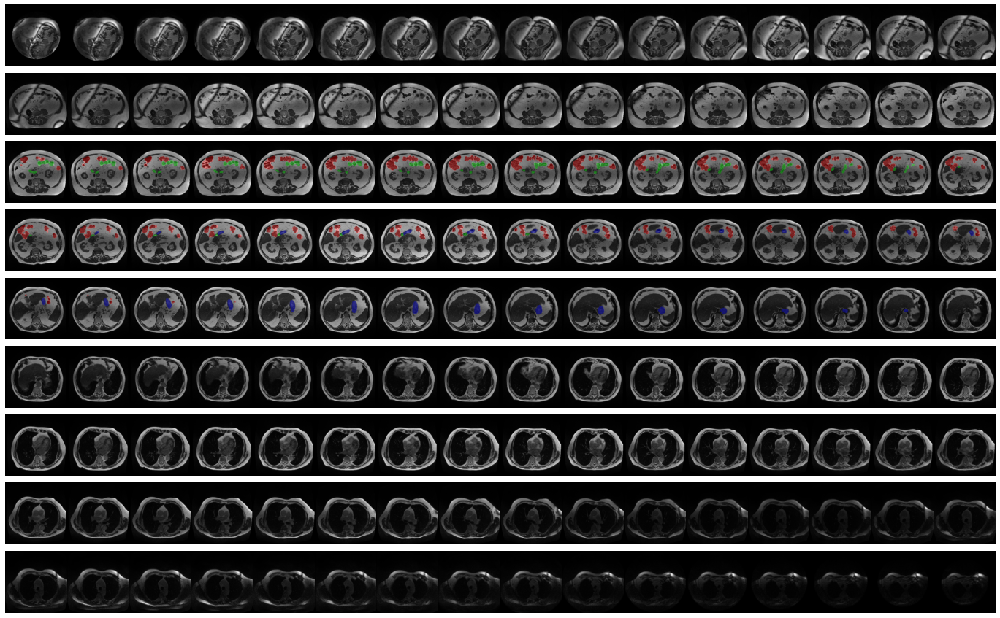

In [15]:
from matplotlib import gridspec
def plot_case(case_id, day=None, df=train_df, _figsize=(20,30), n_cols=16):
    # Initialize
    case_df = df[df.case_id==case_id]
    
    if day is not None:
        _case_df = case_df[(case_df.day_num==day) | (case_df.day_num_str==str(day))]
        if len(_case_df)>0:
            approx_shrink = len(_case_df)/len(case_df)
            case_df=_case_df
            _figsize = (_figsize[0], int(np.ceil(1.25*_figsize[1]*approx_shrink)))
        else:
            print("There are no valid samples for the passed `day`. Reverting to all days in case.")
        del _case_df
    
    n_ex = len(case_df)
    
    print("...Preparing...")
    # Get relevant data
    case_paths = case_df["f_path"].tolist()
    case_rles = [[_rle if not pd.isna(_rle) else None for _rle in _rles] for _rles in case_df[["lb_seg_rle", "sb_seg_rle", "st_seg_rle"]].values.tolist()]
    case_img_shapes = [(_w,_h) for _w,_h in zip(case_df["slice_w"].tolist(), case_df["slice_h"].tolist())]
    all_overlays = [get_overlay(img_path, rle_strs, img_shape) for img_path, rle_strs, img_shape in zip(case_paths, case_rles, case_img_shapes)]
    
    print("...Plotting...")    
    # Plot
    plt.figure(figsize=_figsize)
    n_rows = int(np.ceil(n_ex/n_cols))
    
    gs = gridspec.GridSpec(n_rows, n_cols,
         wspace=0.0, hspace=0.0, 
         top=1.-0.5/(n_rows+1), bottom=0.5/(n_rows+1), 
         left=0.5/(n_cols+1), right=1-0.5/(n_cols+1))
    
    for i in range(n_rows):
        if len(all_overlays)==0: break
        for j in range(n_cols):
            if len(all_overlays)==0: break
            ax=plt.subplot(gs[i,j])
            ax.imshow(all_overlays.pop())
            ax.axis(False)
            ax.set_xticklabels([])
            ax.set_yticklabels([])
        
    print("...Displaying...")    
    plt.show()
        
DEMO_CASE = 134
print(f"\n\n... PLOTTING DEMO CASE ID #{DEMO_CASE} ...\n\n")
plot_case(DEMO_CASE)

DEMO_CASE = 9
print(f"\n\n\n\n... PLOTTING DEMO CASE ID #{DEMO_CASE} ...\n\n")
plot_case(DEMO_CASE)

DEMO_CASE = 7
DEMO_DAYS = [0, 13, 19]
for _dday in DEMO_DAYS:
    print(f"\n\n\n... PLOTTING DEMO CASE ID #{DEMO_CASE} - FOR DAY #{_dday} ...\n\n")
    plot_case(DEMO_CASE, day=_dday)

<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: teal; background-color: #ffffff;">4.5 MASK SIZES/AREAS</h3>

---

I know that every other number in an RLE encoding represents a run of mask... so if I add up all those numbers I get the total number of masked pixels in an image. This is much faster than opening and closing each image.

<br><b style="text-decoration: underline; font-family: Verdana; text-transform: uppercase;">OBSERVATIONS</b>

* It's observable that the distributions of mask area is mostly normal although it skews slightly to the smaller side...
* All the distributions are similar although the Stomach distribution has an odd gap between 400-750 pixels.
* It's interesting to note that, while not common, we do have some VERY large masks (>7500 pixels)
    * Also, it's kind of funny that the biggest masks are for **small** bowel
    




... EXAMINE AN EXAMPLE WITH A LARGE AMOUNT OF SEGMENTATION MASK ...


... ID (case134_day22_slice_0102) EXPLORATION STARTED ...




... IMAGE WITH RGB SEGMENTATION MASK OVERLAY ...



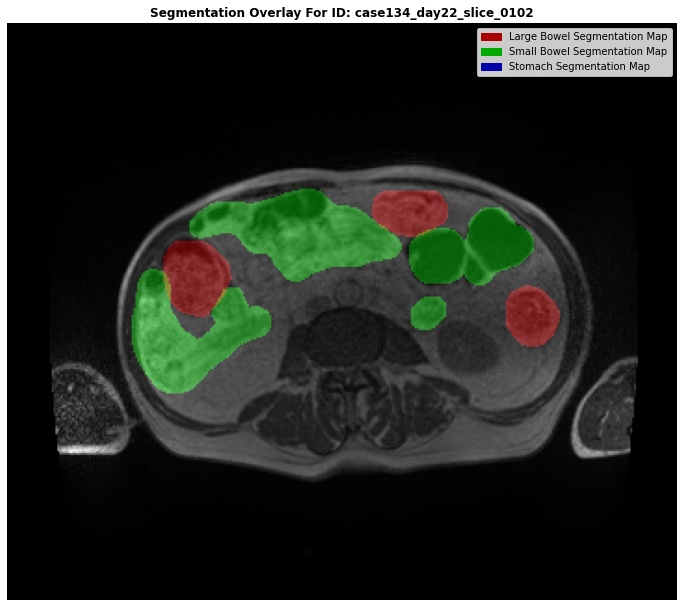



... SINGLE ID EXPLORATION FINISHED ...




In [16]:
def get_mask_area(rle):
    return sum([int(x) for x in rle.split()[1::2]])

train_df["lb_seg_area"] = train_df.lb_seg_rle.apply(lambda x: None if pd.isna(x) else get_mask_area(x))
train_df["sb_seg_area"] = train_df.sb_seg_rle.apply(lambda x: None if pd.isna(x) else get_mask_area(x))
train_df["st_seg_area"] = train_df.st_seg_rle.apply(lambda x: None if pd.isna(x) else get_mask_area(x))

fig = px.histogram(train_df, ["lb_seg_area", "sb_seg_area", "st_seg_area"], title="<b>Mask Areas Overlaid</b>", barmode="overlay",
                  labels={"value":"<b>Mask Area</b>"})
fig.show()

print("\n\n\n... EXAMINE AN EXAMPLE WITH A LARGE AMOUNT OF SEGMENTATION MASK ...\n")
examine_id("case134_day22_slice_0102")

<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: teal; background-color: #ffffff;">4.6 MASK DATASET CREATION, CLASS OVERLAP & MASK HEATMAP</h3>

---

It's important to determine if the the masks overlap one another (**multilabel**) or not (**multiclass**). To do this, I will quickly create a dataset of **`npy`** files. During this creation process we will check for overlap.

<br><b style="text-decoration: underline; font-family: Verdana; text-transform: uppercase;">OBSERVATIONS</b>

* There is overlap, and while it is not that common, some images exhibit a high degree of overlap.
* This means that we cannot frame the problem as simple categorical semantic segmentation.
* We must instead frame the problem as multi-label semantic segmentation
* This means our mask will take the form --> $W \times H \times 3$
    * Where the channel dimensions are binary masks for each respective segmentation type
    * This will allow for the masks to overlap


**NOTE ON THE PLOTTED IMAGE BELOW:**
* In the examined image below we can see a section of the small bowel is completely inside of a larger section of larger bowel.
* This shows why treating this as multi-label semantic segmentation is so important!

  0%|          | 0/38496 [00:00<?, ?it/s]


... LET'S EXAMINE THE IMAGE WITH THE HIGHEST AMOUNT OF OVERLAP ...


... ID (case84_day0_slice_0121) EXPLORATION STARTED ...




... IMAGE WITH RGB SEGMENTATION MASK OVERLAY ...



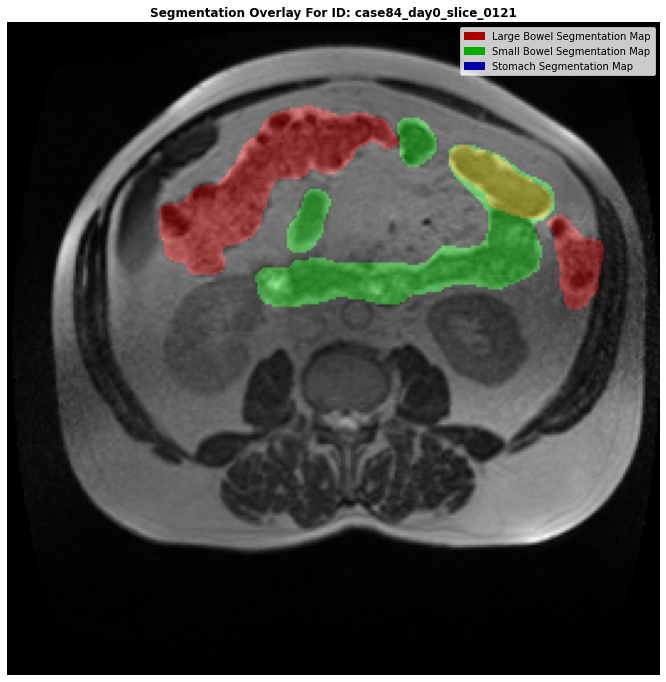



... SINGLE ID EXPLORATION FINISHED ...




In [17]:
def is_overlap(_arr):
    return _arr.sum(axis=-1).max()>1
    
def make_seg_mask(row, output_dir="/Users/yunjaewon/tensorflow/npy_files", check_overlap=False):
    slice_shape = (row.slice_w, row.slice_h)
    if not pd.isna(row.lb_seg_rle):
        lb_mask = rle_decode(row.lb_seg_rle, slice_shape, )
    else:
        lb_mask = np.zeros(slice_shape)
    if not pd.isna(row.sb_seg_rle):
        sb_mask = rle_decode(row.sb_seg_rle, slice_shape)
    else:
        sb_mask = np.zeros(slice_shape)
    if not pd.isna(row.st_seg_rle):
        st_mask = rle_decode(row.st_seg_rle, slice_shape)
    else:
        st_mask = np.zeros(slice_shape)
    mask_arr = np.stack([lb_mask, sb_mask, st_mask], axis=-1).astype(np.uint8)
    np.save(f"./npy_files/{row.id}_mask", mask_arr)
    
    if check_overlap: 
        if is_overlap(mask_arr): 
            return np.where(mask_arr.sum(axis=-1)>1, 1, 0).sum()
        else:
            return 0
    
NPY_DIR = "/Users/yunjaewon/tensorflow/npy_files"
if not os.path.isdir(NPY_DIR): os.makedirs(NPY_DIR, exist_ok=True)
train_df["seg_overlap_area"] = train_df.progress_apply(lambda x: make_seg_mask(x, output_dir=NPY_DIR, check_overlap=True), axis=1)

print("\n... LET'S EXAMINE THE IMAGE WITH THE HIGHEST AMOUNT OF OVERLAP ...\n")

examine_id(train_df[train_df.seg_overlap_area==train_df.seg_overlap_area.max()].id.values[0])

fig = px.histogram(train_df[train_df.seg_overlap_area>0], "seg_overlap_area", color="seg_combo_str", nbins=50,
                   log_y=True, title="<b>Distribution of Non-Zero Segmentation Overlaps <sub>(Count Is Logarithmic)</sub></b>",  
                   labels={"seg_overlap_area":"<b>Area of Mask Overlap</b>", 
                           "seg_combo_str":"<b>Segmentation Masks In Image</b>"})
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="right",
    x=0.995
))
fig.show()

  0%|          | 0/38496 [00:00<?, ?it/s]

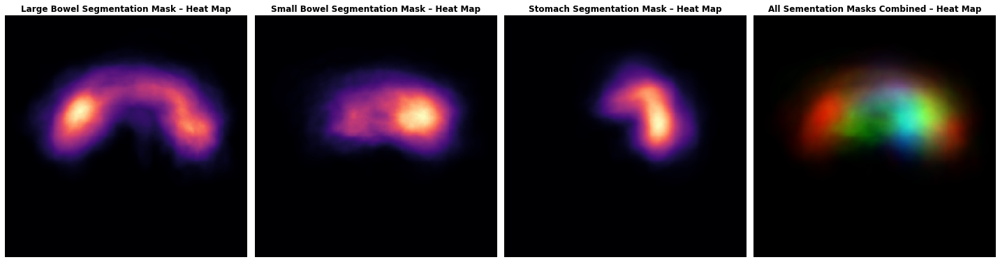

In [18]:
heatmap = np.zeros((256,256,3), dtype=np.float32)
for _, _row in tqdm(train_df.iterrows(), total=len(train_df)):
    if (_row.lb_seg_flag or _row.sb_seg_flag or _row.st_seg_flag):
        _mask = cv2.resize(np.load(f"./npy_files/{_row.id}_mask.npy"), (256,256), interpolation=cv2.INTER_NEAREST)
        heatmap+=_mask

heatmap=heatmap/heatmap.max()

plt.figure(figsize=(20,12))

plt.subplot(1,4,1)
plt.imshow(heatmap[..., 0], cmap="magma")
plt.title("Large Bowel Segmentation Mask – Heat Map", fontweight="bold")
plt.axis(False)

plt.subplot(1,4,2)
plt.imshow(heatmap[..., 1], cmap="magma")
plt.title("Small Bowel Segmentation Mask – Heat Map", fontweight="bold")
plt.axis(False)

plt.subplot(1,4,3)
plt.imshow(heatmap[..., 2], cmap="magma")
plt.title("Stomach Segmentation Mask – Heat Map", fontweight="bold")
plt.axis(False)

plt.subplot(1,4,4)
plt.imshow(heatmap)
plt.title("All Sementation Masks Combined – Heat Map", fontweight="bold")
plt.axis(False)

plt.tight_layout()
plt.show()

<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: teal; background-color: #ffffff;">4.7 PIXEL VALUES IN OUR DATASET</h3>

---

It's important to analyse the dataset because I will need to normalize the data to convert it into a format that is more expected for machine learning (uint8 (0-255) or float32 (0-1)). Without knowing the limits of the images, I may diminish the resolution of the data by accident when normalizing.

<br><b style="text-decoration: underline; font-family: Verdana; text-transform: uppercase;">OBSERVATIONS</b>

Interestingly the maximum value in the dataset is equiavlent to less than half of an int16 or a quarter of a uint16.
* Max Value for UINT16
    * **65535**
* Max Value for INT16
    * **32767**
* Half of Max Value for INT16
    * **16384**
* Actual Max Value in the dataset
    * **15865**

In [19]:
def get_image_vals(row):
    _img = cv2.imread(row.f_path, -1)
    _nonzero_px_count = np.count_nonzero(_img)
    
    row["nonzero_num_pxs"] = _nonzero_px_count
    row["max_px_value"] = _img.max()
    row["min_px_value"] = _img.min()
    row["mean_px_value"] = _img.mean()
    row["nonzero_mean_px_value"] = _img.sum()/_nonzero_px_count
    
    return row

train_df = train_df.progress_apply(get_image_vals, axis=1)

print(f"\n\n\n... UPDATED TRAIN DATAFRAME ...\n")
display(train_df.head())
print("\n\n")

for _c in ["nonzero_num_pxs", "max_px_value", "min_px_value", "mean_px_value", "nonzero_mean_px_value"]:
    print(f"\n... STATS FOR COLUMN --> `{_c}`...")
    print(f"\t--> MIN  VAL: {train_df[_c].min():.1f}")
    print(f"\t--> MEAN VAL: {train_df[_c].mean():.1f}")
    print(f"\t--> MAX  VAL: {train_df[_c].max():.1f}")

  0%|          | 0/38496 [00:00<?, ?it/s]




... UPDATED TRAIN DATAFRAME ...



,id,f_path,n_segs,lb_seg_rle,lb_seg_flag,sb_seg_rle,sb_seg_flag,st_seg_rle,st_seg_flag,slice_h,...,seg_combo_str,lb_seg_area,sb_seg_area,st_seg_area,seg_overlap_area,nonzero_num_pxs,max_px_value,min_px_value,mean_px_value,nonzero_mean_px_value
0,case123_day20_slice_0001,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,...,No Mask,NaN,NaN,NaN,0,33196,2546,0,105.069549,223.951711
1,case123_day20_slice_0002,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,...,No Mask,NaN,NaN,NaN,0,37465,2964,0,126.488453,238.884746
2,case123_day20_slice_0003,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,...,No Mask,NaN,NaN,NaN,0,41905,3572,0,156.491944,264.234435
3,case123_day20_slice_0004,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,...,No Mask,NaN,NaN,NaN,0,46369,4465,0,191.358754,292.000690
4,case123_day20_slice_0005,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,0,NaN,False,NaN,False,NaN,False,266,...,No Mask,NaN,NaN,NaN,0,50924,5225,0,230.697100,320.540492






... STATS FOR COLUMN --> `nonzero_num_pxs`...
	--> MIN  VAL: 19786.0
	--> MEAN VAL: 66747.9
	--> MAX  VAL: 100576.0

... STATS FOR COLUMN --> `max_px_value`...
	--> MIN  VAL: 19.0
	--> MEAN VAL: 5882.7
	--> MAX  VAL: 15865.0

... STATS FOR COLUMN --> `min_px_value`...
	--> MIN  VAL: 0.0
	--> MEAN VAL: 0.0
	--> MAX  VAL: 0.0

... STATS FOR COLUMN --> `mean_px_value`...
	--> MIN  VAL: 1.6
	--> MEAN VAL: 756.8
	--> MAX  VAL: 3536.7

... STATS FOR COLUMN --> `nonzero_mean_px_value`...
	--> MIN  VAL: 3.8
	--> MEAN VAL: 881.9
	--> MAX  VAL: 3722.4


<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: teal; background-color: #ffffff;">4.8 IDENTIFY ANY HEURISTICS OR RULES REGARDING SEGMENTATION</h3>

---

<br><b style="text-decoration: underline; font-family: Verdana; text-transform: uppercase;">SLICEWISE OBSERVATIONS</b>

For a given **case-id** and **day number** there are two different amounts of scans present
* 144 slices --> 259 instances
* 80 slices ---> 15 instances

* There are no examples for slices number **1, 138, 139, 140, 141, 142, 143 or 144** that have any segmentation masks
* If I break it down by organ we get the following no-value slices for each respective organ
    * **Large Bowel** – **1, 138, 139, 140, 141, 142, 143, 144**
    * **Small Bowel** – **1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 138, 139, 140, 141, 142, 143, 144**
    * **Stomach** – **1, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144**
    
<br><br><b style="text-decoration: underline; font-family: Verdana; text-transform: uppercase;">ROLLING SLICE OBSERVATIONS</b>

Next, I want to identify if there are ever any occurences of a segmentation mask present when there are no segmentation masks before or after (ideally I can measure the prevelance if this exists, and if it doesn't exist, I can identify the minimum number of contiguous segments required).

In [20]:
train_df["lb_seg_isolated"] = False
train_df["sb_seg_isolated"] = False
train_df["st_seg_isolated"] = False

train_df.loc[
    (train_df["lb_seg_flag"]==True) &
    (train_df["lb_seg_flag"]!=train_df["lb_seg_flag"].shift(1, fill_value=False)) &
    (train_df["lb_seg_flag"]!=train_df["lb_seg_flag"].shift(-1, fill_value=False)), "lb_seg_isolated"
] = True

train_df.loc[
    (train_df["sb_seg_flag"]==True) &
    (train_df["sb_seg_flag"]!=train_df["sb_seg_flag"].shift(1, fill_value=False)) &
    (train_df["sb_seg_flag"]!=train_df["sb_seg_flag"].shift(-1, fill_value=False)), "sb_seg_isolated"
] = True

train_df.loc[
    (train_df["st_seg_flag"]==True) &
    (train_df["st_seg_flag"]!=train_df["st_seg_flag"].shift(1, fill_value=False)) &
    (train_df["st_seg_flag"]!=train_df["st_seg_flag"].shift(-1, fill_value=False)), "st_seg_isolated"
] = True

# case43_day18 (lb), case138_day0 (lb), case7_day0 (st)
train_df[train_df.lb_seg_isolated]

,id,f_path,n_segs,lb_seg_rle,lb_seg_flag,sb_seg_rle,sb_seg_flag,st_seg_rle,st_seg_flag,slice_h,...,st_seg_area,seg_overlap_area,nonzero_num_pxs,max_px_value,min_px_value,mean_px_value,nonzero_mean_px_value,lb_seg_isolated,sb_seg_isolated,st_seg_isolated
24885,case43_day18_slice_0038,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,2,27813 3 28079 4 28345 5 28611 6 28877 7 29143 ...,True,NaN,False,39018 13 39281 17 39546 19 39811 20 40077 21 4...,True,266,...,343.0,0,58683,10640,0,1222.708110,1474.258900,True,False,False
31002,case138_day0_slice_0075,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,3,27039 4 27303 8 27569 10 27834 12 28100 14 283...,True,34510 3 34773 7 35038 9 35302 12 35566 14 3583...,True,27020 12 27284 16 27549 17 27814 19 28079 20 2...,True,266,...,573.0,0,64240,15822,0,2319.074707,2554.303394,True,False,False
31005,case138_day0_slice_0078,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,3,27573 4 27837 9 28103 10 28368 13 28634 14 289...,True,32650 2 32914 11 33161 7 33179 13 33426 10 334...,True,26489 7 26750 14 27014 17 27280 18 27545 20 27...,True,266,...,454.0,0,63809,15534,0,2417.306433,2680.482910,True,False,False
31008,case138_day0_slice_0081,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,3,27310 6 27575 9 27840 12 28106 13 28372 13 286...,True,31827 7 32092 9 32357 11 32622 13 32888 15 331...,True,26220 6 26484 10 26748 13 27012 17 27277 19 27...,True,266,...,558.0,0,63584,14202,0,2543.476115,2830.369212,True,False,False
31011,case138_day0_slice_0084,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,3,26778 4 27043 7 27308 10 27574 12 27840 13 281...,True,30232 5 30497 8 30760 11 31023 15 31289 15 315...,True,24348 6 24612 10 24877 14 25141 17 25406 19 25...,True,266,...,771.0,0,63190,13302,0,2603.324919,2915.031777,True,False,False
31024,case138_day0_slice_0097,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,3,25885 2 26149 6 26414 8 26679 9 26944 10 27209...,True,24589 12 24849 19 25112 22 25375 26 25637 30 2...,True,25407 2 25671 6 25937 8 26202 10 26468 10 2673...,True,266,...,130.0,196,59869,13248,0,2777.904771,3283.058511,True,False,False
31027,case138_day0_slice_0100,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,2,27026 6 27204 3 27291 10 27468 7 27555 16 2773...,True,24851 14 25113 20 25376 24 25638 29 25900 33 2...,True,NaN,False,266,...,NaN,9,58915,12690,0,2648.647493,3180.984503,True,False,False
31030,case138_day0_slice_0103,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,2,26486 9 26750 14 27015 17 27281 18 27547 19 27...,True,25107 24 25369 30 25632 34 25895 37 26159 39 2...,True,NaN,False,266,...,NaN,0,58435,12042,0,2576.509356,3119.765483,True,False,False
31033,case138_day0_slice_0106,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,2,27739 4 28004 6 28269 8 28343 9 28535 8 28606 ...,True,24585 3 24849 7 25114 9 25379 11 25639 23 2590...,True,NaN,False,266,...,NaN,9,57756,11754,0,2483.501639,3042.500208,True,False,False
31036,case138_day0_slice_0109,/Users/yunjaewon/tensorflow/uw-madison-gi-trac...,2,27743 4 28008 7 28273 8 28538 9 28597 14 28804...,True,25110 8 25373 16 25636 23 25900 26 26165 28 26...,True,NaN,False,266,...,NaN,0,57446,11358,0,2349.984510,2894.466177,True,False,False



... ID (case7_day0_slice_0052) EXPLORATION STARTED ...




... IMAGE WITH RGB SEGMENTATION MASK OVERLAY ...



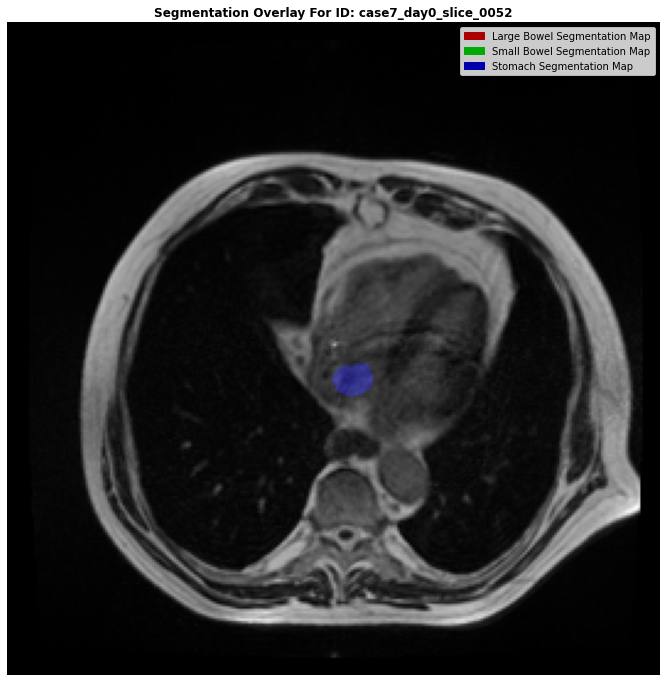



... SINGLE ID EXPLORATION FINISHED ...




In [21]:
examine_id("case7_day0_slice_0052")

In [22]:
train_df["slice_count"] = train_df.id.apply(lambda x: int(x.rsplit("_", 1)[-1]))

print("\n... CASE-ID/DAY-NUM SLICE INFORMATION ...\n")
train_df.groupby(["case_id", "day_num"])["slice_count"].max().value_counts()


... CASE-ID/DAY-NUM SLICE INFORMATION ...



144    259
80      15
Name: slice_count, dtype: int64

In [23]:
slice_to_occurence_df = train_df.groupby("slice_count")[["lb_seg_flag", "sb_seg_flag", "st_seg_flag"]].sum().reset_index()
fig = px.bar(slice_to_occurence_df, 
             x="slice_count", y=["lb_seg_flag", "sb_seg_flag", "st_seg_flag"],
             orientation="v", labels={
                 "slice_count":"<b>Slice Number</b>", 
                 "value":"<b>Number Of Examples</b>",
             }, title="<b>Number of Examples Per Example For Our 3 Organs</b>")

fig.update_layout(
    legend_title="<b>Organ Type Legend</b>"
)
    
fig.show()

print("\n... WHICH SLICES ARE ALWAYS BLANK (NO SEG) BY LABEL ...\n")
keep_slice_blank_map = {_sh_lbl:slice_to_occurence_df[slice_to_occurence_df[f"{_sh_lbl}_seg_flag"]==0].slice_count.to_list() for _sh_lbl in ["lb", "sb", "st"]}
keep_slice_blank_map


... WHICH SLICES ARE ALWAYS BLANK (NO SEG) BY LABEL ...



{'lb': [1, 138, 139, 140, 141, 142, 143, 144],
 'sb': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 138, 139, 140, 141, 142, 143, 144],
 'st': [1,
  128,
  129,
  130,
  131,
  132,
  133,
  134,
  135,
  136,
  137,
  138,
  139,
  140,
  141,
  142,
  143,
  144]}

<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: teal; background-color: #ffffff;">4.11 APPROXIMATE CLASS WEIGHTING (CATEGORICAL ASSUMPTION)</h3>

---

Calculate a naive approximation of the weights of classes based on the frequency of occurence of various classes. For the purpose of this investigation I will treat the background as it's own class (the most common class probably).

<br>

<br><b style="text-decoration: underline; font-family: Verdana; text-transform: uppercase;">OBSERVATIONS</b>

* Class **0** - **Background**
  * Total Pixel Count In Training Dataset = **0.00**
  * Percentage Of All Pixels In Training Dataset = **0.00**
  
<br>

* Class **1** - **Large Bowel**
  * Total Pixel Count In Training Dataset = **0.00**
  * Percentage Of All Pixels In Training Dataset = **0.00**
  
<br>
  
* Class **2** - **Small Bowel**
  * Total Pixel Count In Training Dataset = **0.00**
  * Percentage Of All Pixels In Training Dataset = **0.00**
 
<br>
  
* Class **3** - **Stomach**
  * Total Pixel Count In Training Dataset = **0.00**
  * Percentage Of All Pixels In Training Dataset = **0.00**
  
<br>

In [28]:
# # Get total image area
train_df["img_px_area"] = train_df["slice_w"]*train_df["slice_h"]
train_df[["lb_seg_area", "sb_seg_area", "st_seg_area"]].fillna(0, inplace=True)
train_df["bg_area"] = (train_df["img_px_area"] - train_df[["lb_seg_area", "sb_seg_area", "st_seg_area"]].sum(axis=1)).astype(int)

print(f"\nALL TRAINING DATA PIXEL COUNT         : {train_df.img_px_area.sum()}")
print(f"BACKGROUND TRAINING DATA PIXEL COUNT  : {train_df.bg_area.sum()}")
print(f"LARGE BOWEL TRAINING DATA PIXEL COUNT : {train_df.lb_seg_area.sum()}")
print(f"SMALL BOWEL TRAINING DATA PIXEL COUNT : {train_df.sb_seg_area.sum()}")
print(f"STOMACH TRAINING DATA PIXEL COUNT     : {train_df.st_seg_area.sum()}\n")

print(f"\nALL TRAINING DATA PIXEL COUNT (%)         : %{100:.4f}")
print(f"BACKGROUND TRAINING DATA PIXEL COUNT (%)  : %{100*train_df.bg_area.sum()/train_df.img_px_area.sum():.4f}")
print(f"LARGE BOWEL TRAINING DATA PIXEL COUNT (%) : %{100*train_df.lb_seg_area.sum()/train_df.img_px_area.sum():.4f}")
print(f"SMALL BOWEL TRAINING DATA PIXEL COUNT (%) : %{100*train_df.sb_seg_area.sum()/train_df.img_px_area.sum():.4f}")
print(f"STOMACH TRAINING DATA PIXEL COUNT (%)     : %{100*train_df.st_seg_area.sum()/train_df.img_px_area.sum():.4f}\n")


ALL TRAINING DATA PIXEL COUNT         : 3186782784
BACKGROUND TRAINING DATA PIXEL COUNT  : 3133646797
LARGE BOWEL TRAINING DATA PIXEL COUNT : 21933578.0
SMALL BOWEL TRAINING DATA PIXEL COUNT : 20080562.0
STOMACH TRAINING DATA PIXEL COUNT     : 11121847.0


ALL TRAINING DATA PIXEL COUNT (%)         : %100.0000
BACKGROUND TRAINING DATA PIXEL COUNT (%)  : %98.3326
LARGE BOWEL TRAINING DATA PIXEL COUNT (%) : %0.6883
SMALL BOWEL TRAINING DATA PIXEL COUNT (%) : %0.6301
STOMACH TRAINING DATA PIXEL COUNT (%)     : %0.3490



<br>

<a id="modelling"></a>

<h1 style="font-family: Verdana; font-size: 24px; font-style: normal; font-weight: bold; text-decoration: none; text-transform: none; letter-spacing: 3px; background-color: #ffffff; color: teal;" id="modelling">5&nbsp;&nbsp;MODELLING&nbsp;&nbsp;&nbsp;&nbsp;<a href="#toc">&#10514;</a></h1>

<br>

<h3 style="font-family: Verdana; font-size: 20px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: teal; background-color: #ffffff;">5.1 TEST FORMATTING SUBMISSION</h3>

---


In [29]:
slice_px_map = {}
for _, row in train_df.groupby(["slice_h", "slice_w", "px_spacing_h", "px_spacing_w", "slice_id"])[["lb_seg_rle", "sb_seg_rle", "st_seg_rle"]].first().reset_index().iterrows():
    slice_px_map[f"{row['slice_h']}-{row['slice_w']}-{row['px_spacing_h']}-{row['px_spacing_w']}-{row['slice_id']}-large_bowel"] = row["lb_seg_rle"]
    slice_px_map[f"{row['slice_h']}-{row['slice_w']}-{row['px_spacing_h']}-{row['px_spacing_w']}-{row['slice_id']}-small_bowel"] = row["sb_seg_rle"]
    slice_px_map[f"{row['slice_h']}-{row['slice_w']}-{row['px_spacing_h']}-{row['px_spacing_w']}-{row['slice_id']}-stomach"] = row["st_seg_rle"]

ss_df["ident"] = ss_df['slice_h'].astype(str)+"-"+ss_df['slice_w'].astype(str)+"-"+ss_df['px_spacing_h'].astype(str)+"-"+ss_df['px_spacing_w'].astype(str)+"-"+ss_df['slice_id'].astype(str)+"-"+ss_df["class"].astype(str)
ss_df["predicted"] = ss_df["ident"].map(slice_px_map)
ss_df = ss_df[["id", "class", "predicted"]]

ss_df.to_csv("submission.csv", index=False)
display(ss_df)

,id,class,predicted
0,case123_day20_slice_0001,large_bowel,None
1,case123_day20_slice_0001,small_bowel,None
2,case123_day20_slice_0001,stomach,None
3,case123_day20_slice_0002,large_bowel,None
4,case123_day20_slice_0002,small_bowel,None
5,case123_day20_slice_0002,stomach,None
6,case123_day20_slice_0003,large_bowel,None
7,case123_day20_slice_0003,small_bowel,None
8,case123_day20_slice_0003,stomach,None
9,case123_day20_slice_0004,large_bowel,None
